https://twitter.com/HzBrandenburg/status/1266724167367438336

In [47]:
%%time
dataset_name = "W19_comb"
df_list = [ "BES_Panel" ]

%matplotlib inline 
%run BES_header.py {dataset_name} {df_list}

if "id" in BES_Panel.columns:
    BES_Panel = BES_Panel.set_index("id").sort_index()

(var_type, cat_dictionary, new_old_col_names, old_new_col_names) = get_small_files(data_subfolder, encoding)    
    
# get full set of inferred "cross wave" auth-lib/left-right values and ages
pan_dataset_allr_values = pd.read_csv(BES_small_data_files + "pan_dataset_allr_values"+".csv")
pan_dataset_ages = pd.read_pickle(BES_small_data_files + "pan_dataset_ages"+".zip", compression='zip')



Toggle code

var_type (7911, 14)
Wall time: 30 s


In [48]:
BES_Panel = pd.read_pickle("..\\BES_analysis_data\\"+"W19_comb"+os.sep+"BES_Panelv02",compression='zip')

BES_Panel = BES_Panel.set_index("id")
BES_Panel = BES_Panel.sort_index()
BES_Panel["id"] = BES_Panel.index

In [49]:
from bokeh.models import ColumnDataSource
from bokeh.plotting import figure, show,  output_notebook
from bokeh.layouts import column, row, layout
from bokeh.embed import components
from bokeh.models import HoverTool
from bokeh.models import Span, Label
from bokeh.models import BoxAnnotation
output_notebook()
from datetime import timedelta
from scipy.signal import find_peaks
from bokeh.models import Span
from datetime import datetime
import pytz

Loading BokehJS ...

In [50]:
def weighted_mean(x, **kws):
    val, weight = map(np.asarray, zip(*x))
    val, weight = val[~np.isnan(val)],weight[~np.isnan(val)]
    return (val * weight).sum() / weight.sum()

def datetime_weighted_mean(x, **kws):
    val, weight = map(np.asarray, zip(*x))
    val = pd.Series(val).apply(lambda x: x.timestamp() if pd.notnull(x) else np.nan)
    mask = (~np.isnan(val))
    val, weight = val[mask],weight[mask]
    result = (val * weight).sum() / np.sum(weight)
    result = datetime.fromtimestamp(result,tz=pytz.timezone('GMT')) if pd.notnull(result) else np.nan  # turn back from timestamp
    return result

# max_wave = int(re.match("W(\d+)_",dataset_name).groups()[0])
max_wave = np.max([int(x.replace("wave","")) for x in match(BES_Panel,"wave\d+$").index])
num_to_wave = {x:"W"+str(x) for x in range(1,max_wave+1)}
wts_for_wave = { "W"+str(y):[x for x in BES_Panel.columns.sort_values(ascending=False) if re.match("wt_(new|full)_W"+str(y)+"(_result)?"+"$",x)][0] for y in range(1,max_wave+1) }


waves = BES_Panel[search(BES_Panel,"wave").index].copy()
wts = BES_Panel[wts_for_wave.values()].isnull().copy()
wts.columns = waves.columns
drop_ids = BES_Panel.loc[((wts*waves).sum(axis=1)>0)].index
BES_Panel.drop(drop_ids, inplace=True)

# still leaves some with misssing

BES_Panel[list(wts_for_wave.values())] = BES_Panel[list(wts_for_wave.values())].replace(np.nan,1.0)

wave_to_date = BES_file_manifest[BES_file_manifest["Only_or_Combined"]=="Only"][["Wave No","Date_Start"]].set_index("Wave No")["Date_Start"]


### CHECK TIMES IN NEW 3 WAVES!

# fix endtimeW3 bug!
BES_Panel.loc[BES_Panel["endtimeW3"]=='1970-01-01 00:00:00',"endtimeW3"] = \
    BES_Panel[BES_Panel["endtimeW3"]=='1970-01-01 00:00:00']["starttimeW3"].values

# this is also suspect - date not unreasonable, but overlaps with a different wave! (3 days between start/end)
# 41222   2015-03-27 18:11:37.047
# Name: starttimeW5, dtype: datetime64[ns]
BES_Panel.loc[BES_Panel["starttimeW5"]=='2015-03-27 18:11:37.047000064',"starttimeW5"] = \
    BES_Panel[BES_Panel["starttimeW5"]=='2015-03-27 18:11:37.047000064']["endtimeW5"].values

# still some overlap between waves 4 and 5

midpoint_dict = {}
startpoint_dict = {}
endpoint_dict = {}
# create correct midpoints (technically we should weight these!)
n = 1
min_sample_size = 100
for wave_no in range(1,max_wave+1):
    wave = "W"+str(wave_no)
#     print(wave)

#     BES_Panel["midpoint"+wave] = pd.qcut(BES_Panel["endtime"+wave]+((BES_Panel["endtime"+wave]-BES_Panel["starttime"+wave])/2),n)
#     date_cats_dict = {BES_Panel["midpoint"+wave].cat.categories[x]:(BES_Panel["midpoint"+wave].cat.categories[x].left+ (BES_Panel["midpoint"+wave].cat.categories[x].right - BES_Panel["midpoint"+wave].cat.categories[x].left)/2).strftime("%Y-%m-%d") for x in range(n)}
#     BES_Panel["midpoint"+wave] = pd.to_datetime(BES_Panel["midpoint"+wave].replace(date_cats_dict))  
    BES_Panel["endpoint"+wave] = pd.to_datetime(BES_Panel["endtime"+wave]).max() 
    BES_Panel["startpoint"+wave] = pd.to_datetime(BES_Panel["starttime"+wave]).min() 
    
    BES_Panel["midtime"+wave] = (BES_Panel["starttime"+wave]+(BES_Panel["endtime"+wave]-BES_Panel["starttime"+wave])/2)
#     BES_Panel["midtime"+wave] = BES_Panel["midtime"+wave].apply(lambda x:x.replace(second=0, microsecond=0, nanosecond=0))
    BES_Panel["midpoint"+wave] = datetime_weighted_mean(zip(BES_Panel["midtime"+wave],BES_Panel[wts_for_wave[wave]]))

    startpoint_dict[wave] = BES_Panel["startpoint"+wave].dropna().values[0]
    endpoint_dict[wave] = BES_Panel["endpoint"+wave].dropna().values[0]
    midpoint_dict[wave] = BES_Panel["midpoint"+wave].dropna().values[0]

In [51]:
colour_list = ["blue","red","purple", "olive","orange","brown", "pink","cyan","grey","green"]

In [52]:
BES_Panel["id"] = BES_Panel.index

In [53]:
x_axis_label = "Response Date"
y_axis_label = "Responses/day"
plot_width=980
plot_height=600
tools='box_select,pan,xwheel_zoom,box_zoom,reset'
active_drag='pan'
active_scroll='xwheel_zoom'
title = "British Election Study Waves"
p= figure(x_axis_type="datetime", x_axis_label = x_axis_label,
            y_axis_label = y_axis_label,
            plot_width = plot_width, plot_height=plot_height,
            title = title, tools = tools, active_drag = active_drag, active_scroll=active_scroll)
p.title.text_font_size = '48pt'

date_col_dict = {"EE":'green',"GE":'red',"EU":'blue',"OB":'pink',"CL":'purple',"CAMP":'orange',"normal":'grey'}  

date_dict = {"22 May 2014":"EE","7 May 2015":"GE","23 June 2016":"EU",
             "8 June 2017":"GE","23 May 2019":"EE","21 April 2016":"OB",
             "9 October 2014":"CL","12 December 2019":"GE",
             "3 March 2015":"CAMP", "23 April 2017":"CAMP", "6 November 2019":"CAMP","15 April 2016":"CAMP"}

date_duration_dict = {"22 May 2014":1,"7 May 2015":1,"23 June 2016":1,
             "8 June 2017":1,"23 May 2019":1,"21 April 2016":2,
             "9 October 2014":1,"12 December 2019":1,
             "3 March 2015":37, "23 April 2017": 45, "6 November 2019":35,"15 April 2016":68 }
    
#     date_col_dict = {"EE":'green',"GE":'red',"EU":'blue',"OB":'pink',"CL":'purple',"CAMP":'orange'}  

wave_type_dict = dict(zip(["W"+str(x) for x in range(1,max_wave+1)],["normal"]*max_wave))

wave_type_dict["W1"] = "PRECAMP"
wave_type_dict["W4"] = "PRECAMP"
wave_type_dict["W7"] = "PRECAMP"
wave_type_dict["W11"] = "PRECAMP"
# wave_type_dict["W14"] = "PRECAMP"
wave_type_dict["W17"] = "PRECAMP"

wave_type_dict["W2"] = "CAMP"
wave_type_dict["W5"] = "CAMP"
wave_type_dict["W8"] = "CAMP"
wave_type_dict["W12"] = "CAMP"
wave_type_dict["W15"] = "CAMP"
wave_type_dict["W18"] = "CAMP"

wave_type_dict["W3"] = "POSTCAMP"
wave_type_dict["W6"] = "POSTCAMP"
wave_type_dict["W9"] = "POSTCAMP"
wave_type_dict["W13"] = "POSTCAMP"
wave_type_dict["W16"] = "POSTCAMP"
wave_type_dict["W19"] = "POSTCAMP"

wave_colour = { "PRECAMP": "red", "CAMP": "yellow", "POSTCAMP": "green", "normal":"grey" }

for wave in startpoint_dict.keys():

    my_label = Label(x=midpoint_dict[wave], y=200, y_units='screen', text=wave)
    df = BES_Panel[["midtime"+wave,"id"]].set_index("midtime"+wave).resample('1d').count()["id"]
    ind = df.index.values
    ind[0] = startpoint_dict[wave]
#     ind[-1] = endpoint_dict[wave]
    df.index = ind
    p.quad(top=df.values, bottom=0, left=df.index, right=np.append(df.index[1:].values, endpoint_dict[wave] ),
           fill_color="navy", line_color="white", alpha=0.5)

    box_left = startpoint_dict[wave]
    box_right = endpoint_dict[wave]

    box = BoxAnnotation(left=box_left, right=box_right,
                        line_width=1, line_color='black', line_dash='dashed',
                        fill_alpha=0.2, fill_color= wave_colour[wave_type_dict[wave]])
                        #(colour_list+colour_list)[int(wave.replace("W",""))] )
    
    p.add_layout(my_label) 
    p.add_layout(box)
for date in date_dict.keys():       

    if date_dict[date]=="CAMP" or date_dict[date]=="CL" or date_dict[date]=="OB":
        continue
    my_label = Label(x=pd.to_datetime(date), y=400, y_units='screen', text=date_dict[date])
    p.add_layout(my_label) 

    box_left = pd.to_datetime(date)
    box_right = pd.to_datetime(date)+timedelta(days=date_duration_dict[date])

    box = BoxAnnotation(left=box_left, right=box_right,
                        line_width=1, line_color='black', line_dash='dashed',
                        fill_alpha=0.2, fill_color=date_col_dict[date_dict[date]])

    p.add_layout(box)   

show(p)

In [54]:
def time_series(var_name,title,subtract_var=False,retain_var=True,specific_dates=True, specific_suffix_set="([a-zA-Z]*)",
                use_midpoints=False,col_name="party",dk_str="Don't know",max_y_size=10.0,min_waves_included=2,
                max_y_size_dict=None,max_wave=max_wave,use_BES_weights=True,mask=None):

    whole_wave_dk_average = True
    df=pd.DataFrame()
    df2 =pd.DataFrame()
    df_wts =pd.DataFrame()
    df_dates = pd.DataFrame()
    
    if subtract_var:
        title=title+"\n(where respondents place parties relative to their own preference set at 0.5)"

    wave_list = []
    redist_vars = pd.Series([re.match(var_name+specific_suffix_set+"($|W\d+)",x).groups()[0] for x in BES_Panel.columns\
                             if re.match(var_name+specific_suffix_set+"($|W\d+)",x)]).value_counts()
    redist_vars = redist_vars[redist_vars>=min_waves_included].index

    if mask is None:
        mask = BES_Panel["id"].notnull()
    
    for subj in redist_vars:
        for wave in ["W"+str(x) for x in range(1,max_wave+1)]:
            if var_name+subj+wave not in BES_Panel.columns:
                continue
            else:
                wave_list.append(wave)
            if max_y_size_dict:
                max_y_size = max_y_size_dict[subj]
#             df[var_name+"num_"+subj+"_"+wave] = zip(BES_Panel[var_name+subj+wave].replace(dk_str,np.nan).cat.codes.replace(-1,np.nan)/max_y_size,
#                                                  BES_Panel[var_name+subj+wave].apply(lambda x: x==dk_str if pd.notnull(x) else np.nan),
#                                                  BES_Panel[wts_for_wave[wave]]
#                                                    )
            
            df[var_name+"num_"+subj+"_"+wave] = BES_Panel[var_name+subj+wave][mask].replace(dk_str,np.nan).cat.codes.replace(-1,np.nan)/max_y_size

            
            df2[var_name+"dk_"+subj+"_"+wave] = (BES_Panel[var_name+subj+wave][mask]==dk_str).astype('float32')
            df2[var_name+"dk_"+subj+"_"+wave][BES_Panel[var_name+subj+wave][mask].isnull()] = np.nan

           
            
    for wave in pd.unique(wave_list):        
        df_wts["wt_"+wave] = BES_Panel[wts_for_wave[wave]][mask]
        
        if use_midpoints:
            df_dates["dt_"+wave] = BES_Panel["midpoint"+wave][mask]
        else:
            df_dates["dt_"+wave] = (BES_Panel["starttime"+wave][mask]+(BES_Panel["endtime"+wave][mask]-BES_Panel["starttime"+wave][mask])/2)
#             .apply(lambda x:x.date())

#     set_trace()
#     df_wts = df_wts[df.notnull().any(axis=1)]
#     df = df[df.notnull().any(axis=1)]

    df2.columns = df2.columns.str.split('_', expand=True)
    df2 = df2.stack(dropna=False)\
                .reset_index()\
                .rename(columns={'level_1':"wave"})\
                .rename(columns={'level_0':"id"}) 

    df_wts.columns = df_wts.columns.str.split('_', expand=True)
    df_wts = df_wts.stack(dropna=False)\
                .reset_index()\
                .rename(columns={'level_1':"wave"})\
                .rename(columns={'level_0':"id"}) 

    df_dates.columns = df_dates.columns.str.split('_', expand=True)
    df_dates = df_dates.stack(dropna=False)\
                .reset_index()\
                .rename(columns={'level_1':"wave"})\
                .rename(columns={'level_0':"id"}) 

    df.columns = df.columns.str.split('_', expand=True)
    df = df.stack(dropna=False)\
            .reset_index()\
            .rename(columns={'level_1':"wave"})\
            .rename(columns={'level_0':"id"}) 

    content_columns = [(var_name+"dk",x) for x in redist_vars]
    df["wt"] = df_wts["wt"]
    df[content_columns] = df2[content_columns]
    df["date"] = df_dates["dt"]
    content_columns = [(var_name+"num",x) for x in redist_vars]+[(var_name+"dk",x) for x in redist_vars]
    # only keep rows with content (variable values/dks)

    df = df[df[content_columns].notnull().any(axis=1)]

#     df = df.loc[ df[[x for x in df.columns if var_name+"num" in x]].notnull().any(axis=1) ]
    df.loc[:,"wt"] = df.loc[:,"wt"].fillna(1.0).values
    temp_ind_name = "temp_index"

#     if specific_dates:
#         df["date"] = df[["id","wave"]].merge(right=df_dates,
#                  how="left",left_on=["id","wave"],right_on=["id","wave"])["dt"].values

    df[temp_ind_name] = list(zip(df["wave"],df["wt"],df["date"],df["id"]))
    df = df.set_index(temp_ind_name).drop(["id","wave","wt","date"],axis=1)



    if subtract_var:
        if retain_var:
            focal_vars = [x for x in df.columns if (var_name+"num" in x) and (subtract_var not in x)]
            df[focal_vars] = df[focal_vars].apply(lambda x: x-df[(var_name+"num",  subtract_var)])+0.5
        else:
            focal_vars = [x for x in df.columns if var_name+"num" in x]
            df[focal_vars] = df[focal_vars].apply(lambda x: x-df[(var_name+"num",  subtract_var)])+0.5
            df.drop((var_name+"num",  subtract_var),axis=1,inplace=True)

#     df2["wt"] = df_wts["wt"]

#     df2 = df2.loc[ df2[[x for x in df2.columns if var_name+"dk" in x]].notnull().any(axis=1) ]
#     df2.loc[:,"wt"] = df2.loc[:,"wt"].fillna(1.0).values
#     if specific_dates:
#         df2["date"] = df2[["id","wave"]].merge(right=df_dates,
#                  how="left",left_on=["id","wave"],right_on=["id","wave"])["dt"].values

#     temp_ind_name = "temp_index"
#     df2[temp_ind_name] = list(zip(df2["wave"],df2["wt"],df2["date"]))
#     df2 = df2.set_index(temp_ind_name).drop(["id","wave","wt","date"],axis=1)


    flat_df_num = df.stack().reset_index().rename(columns={'level_1':col_name})

    if specific_dates:
        flat_df_num["wave"] = flat_df_num[temp_ind_name].apply(lambda x:x[0])    
    else:
        flat_df_num["wave"] = flat_df_num[temp_ind_name].apply(lambda x:int(x[0].split("W")[1]))

    flat_df_num["wt"]   = flat_df_num[temp_ind_name].apply(lambda x:x[1])
    flat_df_num["date"] = flat_df_num[temp_ind_name].apply(lambda x:x[2])
    flat_df_num["id"]   = flat_df_num[temp_ind_name].apply(lambda x:x[3])
    
    
    
    flat_df_num.drop(temp_ind_name,axis=1,inplace=True)
    flat_df_num[col_name] = flat_df_num[col_name].astype('category')

    flat_df_num[var_name+"_wts"] = list(zip(flat_df_num[var_name+"num"],flat_df_num["wt"]))
    flat_df_num[var_name+"_dk"] = list(zip(flat_df_num[var_name+"dk"],flat_df_num["wt"]))

    
#     flat_df_dk = df2.stack().reset_index().rename(columns={'level_1':col_name,0:"dk"})
#     if specific_dates:
#         flat_df_dk["wave"] = flat_df_dk[temp_ind_name].apply(lambda x:x[0])    
#     else:
#         flat_df_dk["wave"] = flat_df_dk[temp_ind_name].apply(lambda x:int(x[0].split("W")[1]))

#     flat_df_dk["wt"]   = flat_df_dk[temp_ind_name].apply(lambda x:x[1])
#     flat_df_dk["date"] = flat_df_dk[temp_ind_name].apply(lambda x:x[2])
    
#     flat_df_dk.drop(temp_ind_name,axis=1,inplace=True)
#     flat_df_dk[var_name+"dk"] = flat_df_dk[var_name+"dk"].astype('int')
    
#     if whole_wave_dk_average:
#     # calculating weighted total-wave dk average
#         flat_df_dk = flat_df_dk.groupby(["wave",col_name]).apply(lambda x: (x["wt"]*x[var_name+"dk"]).sum()/x["wt"].sum() ).reset_index().rename(columns={0:"dk"})
#         flat_df_num = flat_df_num.merge(right=flat_df_dk[[col_name,"wave","dk"]],how='left',left_on=[col_name,"wave"],right_on=[col_name,"wave"])        
#     else:
    
#         flat_df_dk["dk"+"_wts"] = list(zip(flat_df_dk[var_name+"dk"],flat_df_num["wt"]))
    

#     flat_df_num = flat_df_num.merge(right=flat_df_dk[[col_name,"wave","dk"]],how='left',left_on=[col_name,"wave"],right_on=[col_name,"wave"])
    if not specific_dates:
        flat_df_num["date"] = flat_df_num["wave"].apply(lambda x: wave_to_date[x])
        flat_df_num["date"] = pd.to_datetime(flat_df_num["wave"] , format="%b-%y")

#     raise Exception
        
    return flat_df_num, df, df2, 

In [142]:
def sample_size(x, **kws):
    global max_sample_size    
    return len(x)/max_sample_size

def between_wave_retention(*args, **kwargs):
    global position_in_var_list
    var_name = kwargs['var_name'][position_in_var_list]
    position_in_var_list = position_in_var_list+1
    color = kwargs['color']
    label = kwargs['label']
    alpha = kwargs['alpha']
    df = BES_Panel[match(BES_Panel,var_name+"($|W\d+)").index].apply(lambda x: x.cat.codes.replace(-1,np.nan)).diff(axis=1).notnull().sum()/match(BES_Panel,var_name+"($|W\d+)")
    waves_present = {"W"+x.split("W")[-1]:BES_Panel["midpointW"+x.split("W")[-1]].dropna().values[0] for x in df.index}    
    df.index = [BES_Panel["midpointW"+x.split("W")[-1]].dropna().values[0] for x in df.index]
    df.drop(df.index[0],inplace=True)
    sns.lineplot(data=df,color=color,label=label,alpha=alpha)

    for wave in waves_present.keys():
        plt.text(x=waves_present[wave],y=0,s=wave, rotation=90, fontsize=12)   
        
def plot_time_series(var_name,specific_suffix_set,title,col_name,col_wrap,treatment,
                     max_wave,use_BES_weights=True,mask=None,n_boot=1,min_waves_included=2,
                     col_order=None,aspect=1):
    dk_str="Don't know"
    lowest_alpha=0.3
    low_alpha=0.5    
    date_dict = {"22 May 2014":"EE","7 May 2015":"GE","23 June 2016":"EU","8 June 2017":"GE","23 May 2019":"EE"}
    date_col_dict = {"EE":'green',"GE":'red',"EU":'blue'}    
#     print(1)
    max_y_size_dict = {x: len(BES_Panel[match(BES_Panel,var_name+x+"($|W\d+)").index[0]].cat.remove_categories(dk_str).cat.categories)-1 for x in specific_suffix_set.replace("(","").replace(")","").split("|") }
    # max_y_size=len(BES_Panel[ match(BES_Panel,var_name+specific_suffix_set+"($|W\d+)").index[0] ].cat.remove_categories(dk_str).cat.categories)-1,
    flat_df_num, df, df2, = time_series(var_name,title,specific_suffix_set=specific_suffix_set,col_name="party",
                                max_y_size_dict = max_y_size_dict,
                                dk_str=dk_str,min_waves_included=min_waves_included,use_midpoints=False,
                                max_wave=max_wave,use_BES_weights=use_BES_weights,mask=mask)
#     print(2)
#     raise Exception
    flat_df_num["wave_midpoint"] = flat_df_num["wave"].apply( lambda x: midpoint_dict[x] )
    flat_df_num["wave_startpoint"] = flat_df_num["wave"].apply( lambda x: startpoint_dict[x] )
    flat_df_num["wave_endpoint"] = flat_df_num["wave"].apply( lambda x: endpoint_dict[x] )
    
    
#     print(3)
    global max_sample_size
    global position_in_var_list
    position_in_var_list=0
#     max_sample_size = flat_df_num["dk"].value_counts().max()
    max_sample_size = flat_df_num.groupby(["party","wave"]).apply(lambda x: len(x)).max()
#     print(4)

    g = sns.FacetGrid(data=flat_df_num, col=col_name, col_wrap=col_wrap, ylim=(0.0, 1.0), legend_out=False,
                      height=height,aspect=aspect,col_order=col_order);
    
#     raise Exception
#     print(5)    
#     raise Exception    
    if use_BES_weights and (n_boot==1):
        g.map(sns.lineplot, "wave_midpoint",var_name+"_wts", ci=None, n_boot=1, label="Mean answer", estimator=weighted_mean,
              err_style="bars", markers=True, dashes=False);
        g.map(sns.lineplot, "wave_midpoint",var_name+"_dk", color='r', ci=None,n_boot=1,estimator=weighted_mean,
              err_style="bars", label="DK fraction",markers=True, dashes=False, alpha=low_alpha);        
    elif use_BES_weights and (n_boot!=1):
        g.map(sns.lineplot, "wave_midpoint",var_name+"_wts", n_boot=n_boot, label="Mean answer", estimator=weighted_mean,
              err_style="bars", markers=True, dashes=False);
        g.map(sns.lineplot, "wave_midpoint",var_name+"_dk", color='r', n_boot=n_boot,estimator=weighted_mean,
              err_style="bars", label="DK fraction",markers=True, dashes=False, alpha=low_alpha);        
        
    else:
        g.map(sns.lineplot, "wave_midpoint",var_name+"num", label="Mean answer",
              err_style="bars", markers=True, dashes=False);
        g.map(sns.lineplot, "wave_midpoint",var_name+"dk", color='r',
              err_style="bars", label="DK fraction",markers=True, dashes=False, alpha=low_alpha);        
    

#     print(7)            
    g.map(sns.lineplot, "wave_midpoint","wave", color='g', estimator=sample_size,ci=None,
          label="Sample Size\n(% of max: "+str(max_sample_size)+")",markers=True, dashes=False, alpha=low_alpha);
#     print(8)                
    g.map(between_wave_retention, "wave_midpoint","wave", color='k', var_name=[var_name+x for x in g.col_names],
          label="Retention",markers=True, dashes=False, alpha=low_alpha);
#     print(9)                

    for date in date_dict.keys():
        if flat_df_num["wave_midpoint"].min()<pd.to_datetime(date) and flat_df_num["wave_midpoint"].max()>pd.to_datetime(date):
            g.map(plt.axvline, x=pd.to_datetime(date), ls='--', c=date_col_dict[date_dict[date]], linewidth=1,
                  alpha=lowest_alpha, label=date_dict[date] )
#     print(10)              
    g.map(plt.axhline, y=0.5, ls='-.', c='grey',linewidth=1, alpha=lowest_alpha)

    g.add_legend().set_ylabels("").set_titles(col_template="{col_name}")
    g.fig.suptitle(title, y=1.0+0.03*len(title.split("\n")));
    [plt.setp(ax.get_xticklabels(), rotation=45) for ax in g.axes.flat]

    output_subfolder = create_subdir(BES_output_folder, treatment)
    g.savefig(output_subfolder +clean_filename(var_name +specific_suffix_set)+ ".png", bbox_inches='tight')
    return flat_df_num

In [171]:


# def rolling_av(party, var_name):

#     df_rolling = flat_df_num[flat_df_num["party"]==party].sort_values(by='date').copy().set_index('date')
# # df_rolling = df_rolling["immignum"].rolling(400,center=True).mean()
#     df_rolling = df_rolling[var_name].dropna().rolling(500,center=True,win_type='blackmanharris').mean()
# # win_type='gaussian').sum(std=3)
# # df_rolling = df_rolling["immignum"].rolling('1h',min_periods=10).mean()
#     return df_rolling

def weighted_mean_for_rolling(processed_dataframe_windowed):
    return np.average(a=processed_dataframe_windowed,weights=processed_dataframe_windowed.index)

def rolling_av_exerimental( party, var_name, win_type='blackmanharris',window_size=500 ):
    
    df_rolling = flat_df_num[flat_df_num["party"]==party].sort_values(by='date').copy()
    min_sample_size=200
    temp_dates = pd.qcut( df_rolling["date"], 
            int(np.floor(df_rolling["date"].notnull().sum()/(min_sample_size))) ).apply(lambda x: x.left+(x.right-x.left)/2)

    return df_rolling.groupby(temp_dates)[var_name].agg( lambda x: weighted_mean(x) )

def rolling_av( party, var_name, win_type='blackmanharris',window_size=250 ):

    df_rolling = flat_df_num[flat_df_num["party"]==party].sort_values(by='date').copy()
    fmt = "%Y-%m-%d:%H"

    # slow!
    if win_type=="BES":
        
        # this is a really dumb way to get the right date index!
        
        date_ind = df_rolling.set_index("date")[var_name].dropna().rolling(window_size,
            center=True).mean().index
#         print(date_ind.shape)
        #df_rolling["date"].copy().values
#         df_rolling.index = flat_df_num[flat_df_num["party"]==party].sort_values(by='date').copy()["date"].values
#         raise Exception
        df_rolling = df_rolling.set_index("wt")[[var_name,'date']].dropna().rolling(window_size,
            on='date',center=True)[var_name].apply(weighted_mean_for_rolling, raw=False)
#         print(df_rolling.shape)
        df_rolling.index = date_ind
#         flat_df_num[flat_df_num["party"]==party].sort_values(by='date').copy()["date"].values
#         return temp
    else:
        df_rolling = df_rolling.set_index("date")[var_name].dropna().rolling(window_size,center=True,win_type=win_type).mean()       


    df_rolling.index = [x.strftime(fmt) for x in df_rolling.index]
    df_rolling.reset_index().groupby('index').mean()
    df_rolling = df_rolling.reset_index().groupby('index').mean().dropna()
    df_rolling.index = [pd.to_datetime(x,format=fmt) for x in df_rolling.index]
    df_rolling.index.name='date'
    return df_rolling[var_name]
    

def date_fraction(x,df_temp):
    
    floor_x = int( np.floor(x) )
    return df_temp.index[floor_x]+(x-floor_x)*(df_temp.index[floor_x+1]-df_temp.index[floor_x])


def detect_peaks(df_rolling,prominence,width):

    df_temp = df_rolling.copy().dropna()
    peaks, properties = find_peaks(df_temp, prominence=prominence, width=width)
    properties["prominences"], properties["widths"]

    x= df_temp.index[peaks]
    y= df_temp[peaks].values

    outliers = pd.DataFrame(properties)
    outliers.index = x

    outliers["left_ips"]  = outliers["left_ips"].apply(lambda x: date_fraction(x,df_temp))
    outliers["right_ips"] = outliers["right_ips"].apply(lambda x: date_fraction(x,df_temp))

    aggregate_to_the_hour_fmt = "%Y-%m-%d:%H"
    aggregate_to_the_day_fmt = "%Y-%m-%d"
    fmt = aggregate_to_the_hour_fmt

    outliers["right_ips"] = outliers["right_ips"].apply(lambda x:pd.to_datetime(x.strftime(fmt),format=fmt) if pd.notnull(x) else np.nan)
    outliers["left_ips"] = outliers["left_ips"].apply(lambda x:pd.to_datetime(x.strftime(fmt),format=fmt) if pd.notnull(x) else np.nan)

    outliers.index = outliers.reset_index()["date"].apply(lambda x:pd.to_datetime(x.strftime(fmt),format=fmt) if pd.notnull(x) else np.nan)
    outliers = outliers.rename(columns = {"left_ips":"start","right_ips":"stop"})

    return x,y,outliers

def get_bokeh_source(flat_df_num,min_sample_size=100,var_name=""):

    flat_df_bokeh = flat_df_num.copy()

    # aggregate dates to the level you wish
    aggregate_to_the_hour_fmt = "%Y-%m-%d:%H"
    aggregate_to_the_day_fmt = "%Y-%m-%d"
    fmt = aggregate_to_the_day_fmt
    flat_df_bokeh["date"] = pd.to_datetime(flat_df_bokeh["date"])
    flat_df_bokeh["shortdate"] = pd.to_datetime(flat_df_bokeh["date"].apply(lambda x:x.strftime(fmt) if pd.notnull(x) else np.nan),
                                        format=fmt)

    flat_df_bokeh["date"] = list(zip(flat_df_bokeh["date"].apply(lambda x: x.timestamp() if pd.notnull(x) else np.nan),
                                     flat_df_num["wt"])) # turn into numeric timestamp
    
    df = flat_df_bokeh.groupby(['shortdate','party'])["date",var_name+"_wts",var_name+"_dk"].agg( lambda x: weighted_mean(x) ).reset_index()
    df["date"] = df["date"].apply(lambda x: datetime.fromtimestamp(x,tz=pytz.timezone('GMT')) if pd.notnull(x) else np.nan  ) # turn back from timestamp
    
    df["N"] = flat_df_bokeh.groupby(['shortdate','party']).count().reset_index()[var_name+"num"]
    df["wt_mean"] = flat_df_bokeh.groupby(['shortdate','party']).mean().reset_index()["wt"]*100/2 # "natural" position at 50%
    df["wt_std"] = flat_df_bokeh.groupby(['shortdate','party']).std().reset_index()["wt"]*100/3
    df["dk"] = df[var_name+"_dk"]*100 # % less confusing than fraction
    df["stdev"] = flat_df_bokeh.groupby(['shortdate','party'])[var_name+"num"].std().reset_index()[var_name+"num"]
    df = df[ df["N"]>=min_sample_size ]
    # plot in bokeh so we can explore!
    df.index = df["date"]
    df = df.rename(columns={var_name+"_wts":var_name+"num"}) # ,"shortdate":"date"
    df = df.pivot(index = "date",columns="party", values=[var_name+'num', 'dk', 'N', 'stdev','wt_mean','wt_std'])
    df.columns = ["_".join(x).strip("_") for x in df.columns]
    df = df.reset_index()
    party_list = flat_df_bokeh["party"].unique()
    
    return df,party_list



def bokeh_time(dtstr):
#     return pd.to_datetime(dtstr).value / 1e6
      return pd.to_datetime(dtstr).timestamp() * 1000

def bokeh_explorer_charts(x_axis_label,y_axis_label,color_dict,title_dict,var_name,x='date',min_sample_size=0,
                          plot_width=490,plot_height=300,dk=True,wts_charts=False,
                          tools='box_select,pan,xwheel_zoom,box_zoom,reset',active_drag='pan',active_scroll='xwheel_zoom',
                          prominence=.15,width=20,rolling_win_type = 'blackmanharris',window_size=250):


    y_axis_label_dk = "&tri=daily-mean-wt/squ=daily-std-wt"
    wave_gap_days_max =2
    lowest_alpha=0.3
    low_alpha=0.5    
    date_dict = {"22 May 2014":"EE","7 May 2015":"GE","23 June 2016":"EU",
                 "8 June 2017":"GE","23 May 2019":"EE","21 April 2016":"OB",
                 "9 October 2014":"CL","12 December 2019":"GE",
                 "3 March 2015":"CAMP", "23 April 2017":"CAMP", "6 November 2019":"CAMP","15 April 2016":"CAMP"}
    date_duration_dict = {"22 May 2014":1,"7 May 2015":1,"23 June 2016":1,
                 "8 June 2017":1,"23 May 2019":1,"21 April 2016":2,
                 "9 October 2014":1,"12 December 2019":1,
                 "3 March 2015":37, "23 April 2017": 45, "6 November 2019":35,"15 April 2016":68 }
    
    date_col_dict = {"EE":'green',"GE":'red',"EU":'blue',"OB":'pink',"CL":'purple',"CAMP":'orange'}        
    
    df,party_list =  get_bokeh_source(flat_df_num, min_sample_size=min_sample_size, var_name=var_name)
    party_list = list( color_dict.keys() )    
    for party in party_list:
        df["scaled_N_"+party] = df["N_"+party].apply(lambda x: np.log2(x+1))/2
    source = ColumnDataSource( df )    


    p = {}
    p_dk = {}
    tool_dict = {}
    outlier_dict = {}
#     rolling_win_type = 'BES'

    
    

    for party in party_list:

        title = title_dict[party]
        color = color_dict[party]
        y = var_name+'num_'+party    

        tool_dict[party]=\
            HoverTool(names=['daily_aggregates'],tooltips = [
                      ('Date','@date{%d/%m/%y}'),
            #                               ('Date','@wave'),
                      ('Mean','@'+var_name+'num_'+party),
                      ('N','@N_'+party),
                      ("SD",'@stdev_'+party),
                      ("DK%",'@dk_'+party),
                     ],
                formatters={'date': 'datetime'},
                # display a tooltip whenever the cursor is vertically in line with a glyph
#                 mode='vline'
                     )


        p[party]= figure(x_axis_type="datetime", x_axis_label = x_axis_label,
                    y_axis_label = y_axis_label,
                    plot_width = plot_width, plot_height=plot_height,
                    title = title, tools = tools, active_drag = active_drag, active_scroll=active_scroll)
        p[party].title.text_font_size = '8pt'

        df_rolling = rolling_av( party, var_name+"num" ,win_type=rolling_win_type,window_size=window_size )
        
        
        # remove the lines connnecting differen waves!
        inferred_wave_gaps = (df_rolling.reset_index()["date"].diff()>timedelta(days=wave_gap_days_max)).astype('int').cumsum()

        if not np.isnan(inferred_wave_gaps.max()):
            for inf_wave in range(0,inferred_wave_gaps.max()+1):   
                rolling_source = ColumnDataSource(pd.DataFrame(df_rolling[df_rolling.index[inferred_wave_gaps==inf_wave]]))
                p[party].line(x,var_name+"num", source=rolling_source, color=color)


        x_out,y_out,outliers = detect_peaks(df_rolling,prominence,width)
        p[party].x(x_out,y_out,color = 'green',size=20, alpha=0.5)

        p[party].circle(x,y, source=source, color=color,name='daily_aggregates', size='scaled_N_'+party,
                        fill_alpha=0.0,line_width=1)
        p[party].add_tools(tool_dict[party])
        outliers.name = party
        outlier_dict[party] = outliers

         
                             

        if dk:
            df_rolling = rolling_av( party, var_name+"dk",win_type=rolling_win_type,window_size=window_size )*100

            p_dk[party]= figure(x_axis_type="datetime",x_axis_label = x_axis_label,
                            y_axis_label=y_axis_label_dk,
                            plot_width = plot_width, plot_height=plot_height,
                            title="".join(title.split(" (")[:-1]+[" (% Don't know)"]),
                            tools=tools, active_drag=active_drag, active_scroll=active_scroll)
            p_dk[party].title.text_font_size = '8pt'

            p_dk[party].circle('date', 'dk_'+party, source=source, color=color, name='daily_aggregates',
                                size='scaled_N_'+party, fill_alpha=0.0,line_width=1)
            if wts_charts:
                p_dk[party].triangle('date', 'wt_mean_'+party, source=source, color=color, 
                                    size='scaled_N_'+party, fill_alpha=0.0,line_width=1)    
                p_dk[party].square('date', 'wt_std_'+party, source=source, color=color, 
                                    size='scaled_N_'+party, fill_alpha=0.0,line_width=1) 
            
            p_dk[party].add_tools( tool_dict[party] )

            inferred_wave_gaps = (df_rolling.reset_index()["date"].diff()>timedelta(days=wave_gap_days_max)).astype('int').cumsum()
            if not np.isnan(inferred_wave_gaps.max()):
                for inf_wave in range(0,inferred_wave_gaps.max()+1):   
                    rolling_source = ColumnDataSource(pd.DataFrame(df_rolling[df_rolling.index[inferred_wave_gaps==inf_wave]]))
                    p_dk[party].line(x,var_name+"dk", source=rolling_source, color=color)

            x_out,y_out,outliers = detect_peaks(df_rolling,prominence*100,width)
            p_dk[party].x(x_out,y_out,color = 'green',size=20, alpha=0.5)
   
        for date in date_dict.keys():       
            
            if flat_df_num["wave_startpoint"].min()<pd.to_datetime(date) and flat_df_num["wave_endpoint"].max()>pd.to_datetime(date):
                
                my_label = Label(x=pd.to_datetime(date), y=200 + (date_duration_dict[date]>2)*40,
                                 y_units='screen', text=date_dict[date])
                p[party].add_layout(my_label) 
            
                box_left = pd.to_datetime(date)
                box_right = pd.to_datetime(date)+timedelta(days=date_duration_dict[date])

                box = BoxAnnotation(left=box_left, right=box_right,
                                    line_width=1, line_color='black', line_dash='dashed',
                                    fill_alpha=0.2, fill_color=date_col_dict[date_dict[date]])

                p[party].add_layout(box)   
                if dk:
                    p_dk[party].add_layout(my_label) 
                    p_dk[party].add_layout(box) 

    for pno in range(0,len(party_list)):
        for pno2 in range(0,len(party_list)):
            if pno==pno2:
                continue
            p[party_list[pno]].x_range = p[party_list[pno2]].x_range
            p[party_list[pno2]].x_range = p[party_list[pno]].x_range

            if dk:
                p[party_list[pno2]].x_range = p_dk[party_list[pno2]].x_range
                p_dk[party_list[pno]].x_range = p_dk[party_list[pno2]].x_range

    if len(party_list)>1:
        p[party_list[1]].x_range = p[party_list[0]].x_range                
                
    if dk:
        p[party_list[0]].x_range = p_dk[party_list[0]].x_range
        lay = layout( [[y for y in x] for x in list(zip(p.values(),p_dk.values()))] )
    else:
        lay = layout( list(p.values()) )



    show(lay)

    for party in party_list:
        print(party)
        display(outlier_dict[party])
        
    return df,df_rolling

In [57]:
wave_to_date[17] = "Nov-19"
wave_to_date[18] = "Nov-19"
wave_to_date[19] = "Dec-19"

In [147]:
use_BES_weights = True
rolling_win_type = "BES"

In [59]:
# use_BES_weights = False
# rolling_win_type = 'blackmanharris'

In [60]:
# search(BES_Panel , "past")

In [61]:
# Con2019 = BES_Panel["p_past_vote_2019"]=="Conservative"
# ConBefore2019 = (BES_Panel[["p_past_vote_2015","p_past_vote_2017",]]=="Conservative").any(axis=1)
# mask = (Con2019&(~ConBefore2019))
# mask.sum()


2342

In [148]:
Con2019 = BES_Panel["p_past_vote_2019"]=="Conservative"
ConBefore2019 = (BES_Panel[["p_past_vote_2005","p_past_vote_2010","p_past_vote_2015","p_past_vote_2017",]]=="Conservative").any(axis=1)
mask = (Con2019&(~ConBefore2019))
mask.sum()

1909

## How *the entire electorate's* feelings about the Conservative Party changed over time

Wall time: 3min 1s


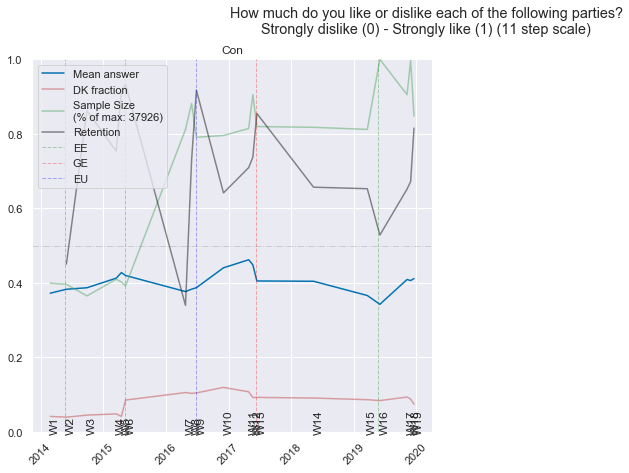

In [63]:
%%time
var_name = "like"
title= "\n".join(["How much do you like or dislike each of the following parties?",
                  "Strongly dislike (0) - Strongly like (1) (11 step scale)"])
specific_suffix_set = "(Con|Lab|LD|SNP|PC|UKIP|Grn|TIG|BNP|BrexitParty)"
specific_suffix_set = "(Con)"
# 
col_wrap = 2
height   = 6

flat_df_num = plot_time_series(var_name=var_name,specific_suffix_set=specific_suffix_set,title=title,col_name="party",
                               col_wrap=col_wrap,treatment="immig_timeseries",max_wave=max_wave,use_BES_weights=use_BES_weights,
#                                mask = mask
                              )
                               #,use_BES_weights=True)

## Now just the people who voted Conservative in 2019 but not before
## (includes people who didn't vote/were too young to vote before)

Wall time: 26.1 s


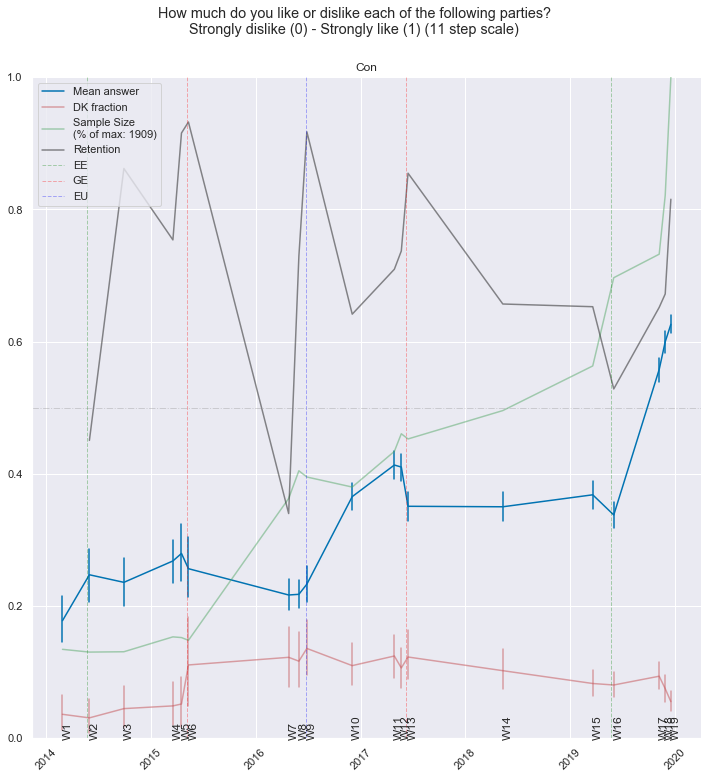

In [149]:
%%time
var_name = "like"
title= "\n".join(["How much do you like or dislike each of the following parties?",
                  "Strongly dislike (0) - Strongly like (1) (11 step scale)"])
specific_suffix_set = "(Con|Lab|LD|SNP|PC|UKIP|Grn|TIG|BNP|BrexitParty)"
specific_suffix_set = "(Con)"
# 
col_wrap = 1
height   = 10

flat_df_num = plot_time_series(var_name=var_name,specific_suffix_set=specific_suffix_set,title=title,col_name="party",
                               col_wrap=col_wrap,treatment="immig_timeseries",max_wave=max_wave,use_BES_weights=use_BES_weights,
                               mask = mask,n_boot=1000,
                              )
                               #,use_BES_weights=True)

## How those same people feel about *all* the parties

Wall time: 2min 56s


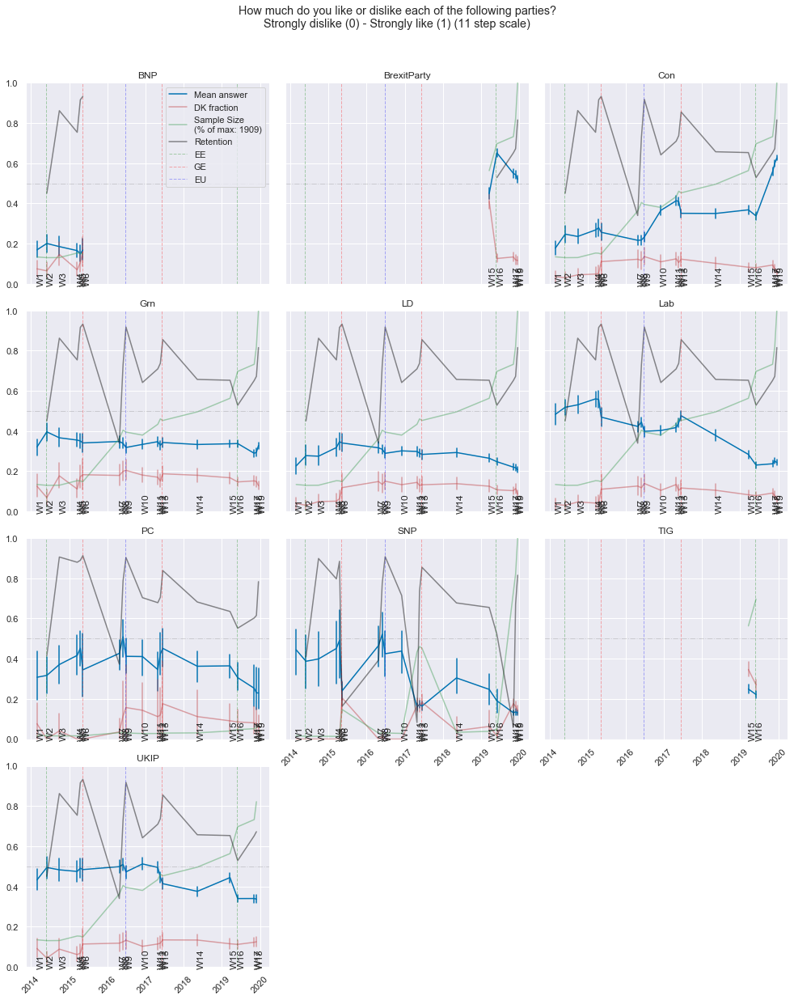

In [150]:
%%time
var_name = "like"
title= "\n".join(["How much do you like or dislike each of the following parties?",
                  "Strongly dislike (0) - Strongly like (1) (11 step scale)"])
specific_suffix_set = "(Con|Lab|LD|SNP|PC|UKIP|Grn|TIG|BNP|BrexitParty)"
# specific_suffix_set = "(Con)"
# 
col_wrap = 3
height   = 4

flat_df_num = plot_time_series(var_name=var_name,specific_suffix_set=specific_suffix_set,title=title,col_name="party",
                               col_wrap=col_wrap,treatment="immig_timeseries",max_wave=max_wave,use_BES_weights=use_BES_weights,
                               mask = mask,n_boot=1000,aspect=1.15,
                              )
                               #,use_BES_weights=True)

## If you're wondering if those people are *pretty Brexity* - they are

In [151]:
BES_Panel["p_eurefvote"][mask].value_counts()

Leave the EU             1438
Stay/remain in the EU     239
Don't know                  4
Name: p_eurefvote, dtype: int64

## But what if the shift happens *within* the BES waves?
## Here's a visualisation that lets you navigate the timeline and look at the patterns within  waves
## (mousewheel lets you zoom into/out of the horizontal scale)

In [152]:
%%time

y_axis_label = "circles=daily-mean/line=moving average"
x_axis_label = "Response Date"


suff_list = specific_suffix_set.replace(")","").replace("(","").split("|")
color_dict = dict(zip(suff_list,colour_list))
title_dict = dict(zip(suff_list,["How much do you like (1) or dislike (0) each of the following parties? "+"("+x+")?" for x in suff_list]))

prominence=.15
width=20

df,df_rolling = bokeh_explorer_charts(x_axis_label,y_axis_label,color_dict,title_dict, var_name,
                    prominence=prominence,width=width, rolling_win_type=rolling_win_type)

Con


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Lab


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


LD


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


SNP


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2016-06-08 12:00:00,0.187318,38,1946,171.440036,0.33495,2015-05-18 04:00:00,2016-11-26 20:00:00


PC


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


UKIP


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2016-12-09 10:00:00,0.162743,22,3233,98.646447,0.519319,2016-12-03 16:00:00,2017-04-24 16:00:00


Grn


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


TIG


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


BNP


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


BrexitParty


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2019-06-08 18:00:00,0.228943,61,671,314.194225,0.58046,2019-05-25 09:00:00,2019-11-02 11:00:00


Wall time: 58.6 s


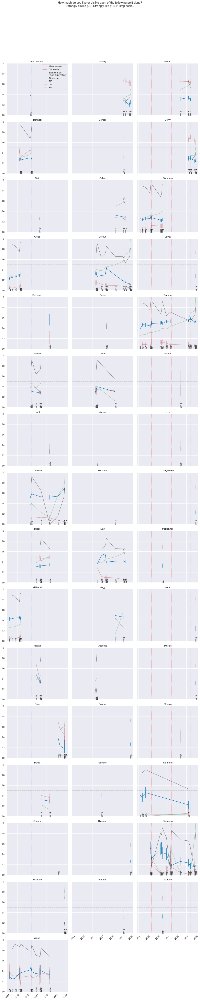

In [153]:
# %%time
var_name = "like"
title= "\n".join(["How much do you like or dislike each of the following politicians?",
                  "Strongly dislike (0) - Strongly like (1) (11 step scale)"])
specific_suffix_set = "(AlanJohnson|Bartley|Batten|Bennett|Berger|Berry|Blair|Johnson|Cable|Cameron|Clegg|Corbyn|Davey|Davidson|Davis|Farage|Farron|Gove|Harvie|Hunt|Jarvis|Javid|Leonard|LongBailey|Lucas|May|McDonnell|Miliband|Mogg|Moran|Nuttall|Osborne|Phillips|Price|Rayner|Rennie|Rudd|SEvans|Salmond|Soubry|Starmer|Sturgeon|Swinson|Umunna|Watson|Wood)"
# 
col_wrap = 3
height   = 4

flat_df_num = plot_time_series(var_name=var_name,specific_suffix_set=specific_suffix_set,title=title,col_name="party",
                               col_wrap=col_wrap,treatment="immig_timeseries",max_wave=max_wave,use_BES_weights=use_BES_weights,
                               mask = mask,n_boot=1000,min_waves_included=1,aspect=1.15)

Wall time: 2min 34s


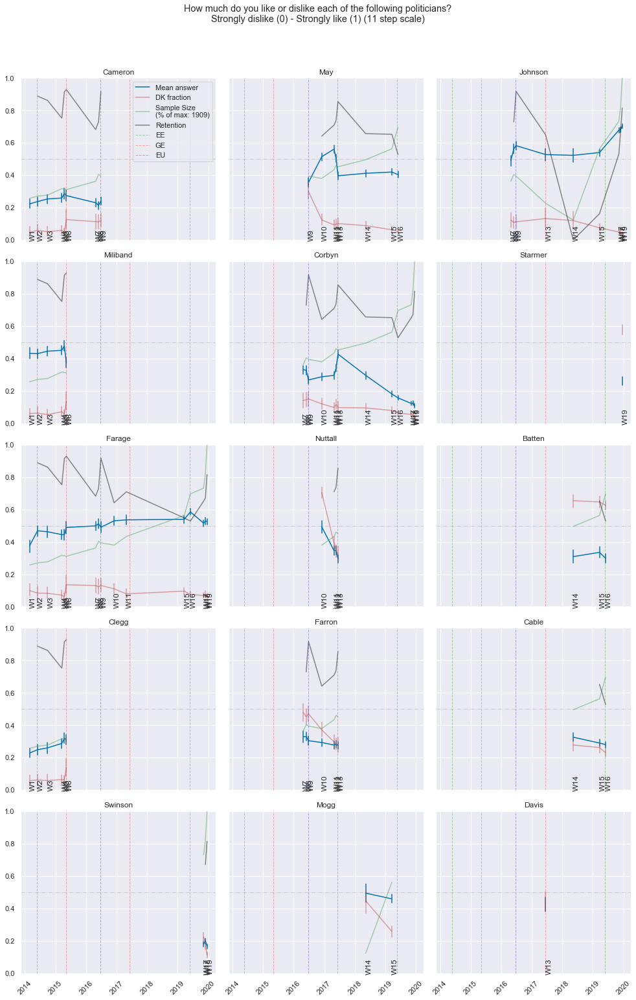

In [154]:
%%time
var_name = "like"
title= "\n".join(["How much do you like or dislike each of the following politicians?",
                  "Strongly dislike (0) - Strongly like (1) (11 step scale)"])
specific_suffix_set = "(Cameron|May|Johnson|Miliband|Corbyn|Starmer|Farage|Nuttall|Batten|Clegg|Farron|Cable|Swinson|Mogg|Davis)"

# 
col_wrap = 3
height   = 4

flat_df_num = plot_time_series(var_name=var_name,specific_suffix_set=specific_suffix_set,title=title,col_name="party",
                               col_wrap=col_wrap,treatment="immig_timeseries",max_wave=max_wave,use_BES_weights=use_BES_weights,
                               mask = mask,n_boot=1000,min_waves_included=1,aspect=1.15,
                               col_order=specific_suffix_set.replace(")","").replace("(","").split("|") )

In [155]:
%%time

y_axis_label = "circles=daily-mean/line=moving average"
x_axis_label = "Response Date"


suff_list = specific_suffix_set.replace(")","").replace("(","").split("|")
color_dict = dict(zip(suff_list,cycle(colour_list)))
title_dict = dict(zip(suff_list,["How much do you like (1) or dislike (0) each of the following politicians? "+"("+x+")?" for x in suff_list]))

prominence=.15
width=20
                                 
df,df_rolling = bokeh_explorer_charts(x_axis_label,y_axis_label,color_dict,title_dict, var_name,
                    prominence=prominence,width=width, rolling_win_type=rolling_win_type)


Cameron


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


May


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2017-04-27 21:00:00,0.232222,0,956,648.520808,0.47566,2016-11-25 19:00:00,2017-05-26 08:00:00


Johnson


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Miliband


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Corbyn


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2017-06-13 21:00:00,0.223164,792,3411,269.595143,0.351213,2017-05-28 16:00:00,2017-06-19 03:00:00


Starmer


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Farage


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2019-06-01 11:00:00,0.190262,77,3234,311.648179,0.531275,2019-05-25 09:00:00,2019-11-01 18:00:00


Nuttall


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Batten


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Clegg


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Farron


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Cable


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Swinson


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Mogg


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Davis


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Wall time: 49.4 s


Wall time: 1min 42s


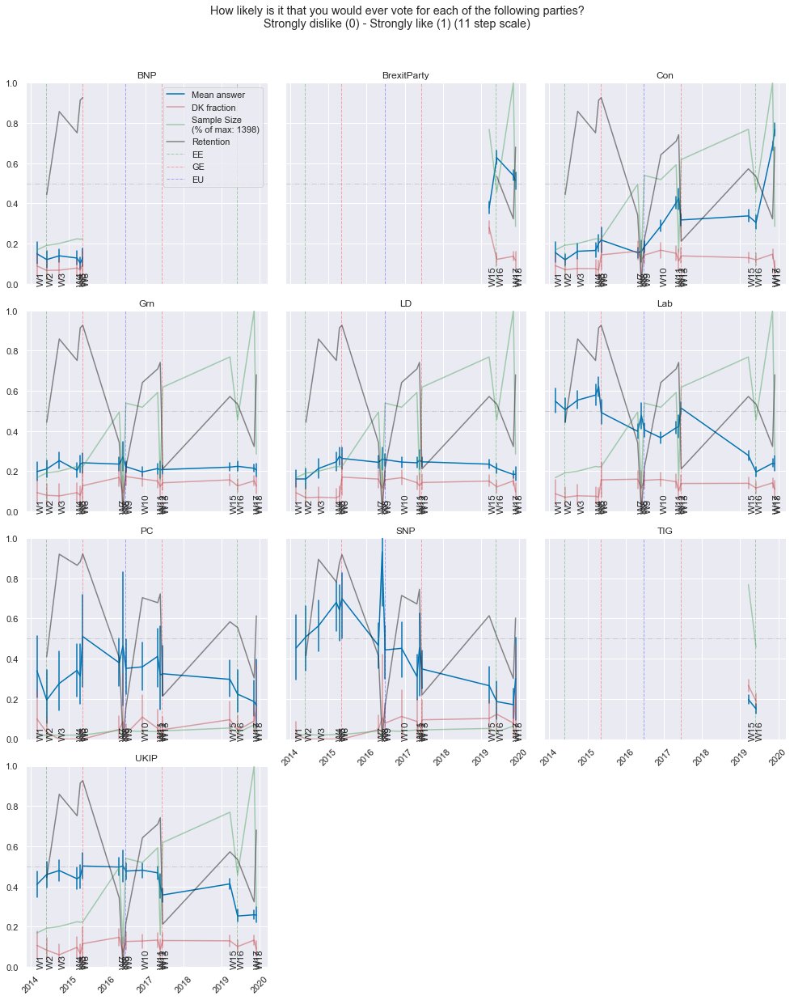

In [156]:
%%time
var_name = "ptv"
title= "\n".join(["How likely is it that you would ever vote for each of the following parties?",
                  "Strongly dislike (0) - Strongly like (1) (11 step scale)"])
specific_suffix_set = "(Con|Lab|LD|SNP|PC|UKIP|Grn|TIG|BNP|BrexitParty)"
# specific_suffix_set = "(Con)"
# 
col_wrap = 3
height   = 4

flat_df_num = plot_time_series(var_name=var_name,specific_suffix_set=specific_suffix_set,title=title,col_name="party",
                               col_wrap=col_wrap,treatment="ptv_timeseries",max_wave=max_wave,use_BES_weights=use_BES_weights,
                               mask = mask,n_boot=1000,aspect=1.15,
                              )
                               #,use_BES_weights=True)

Wall time: 30.3 s


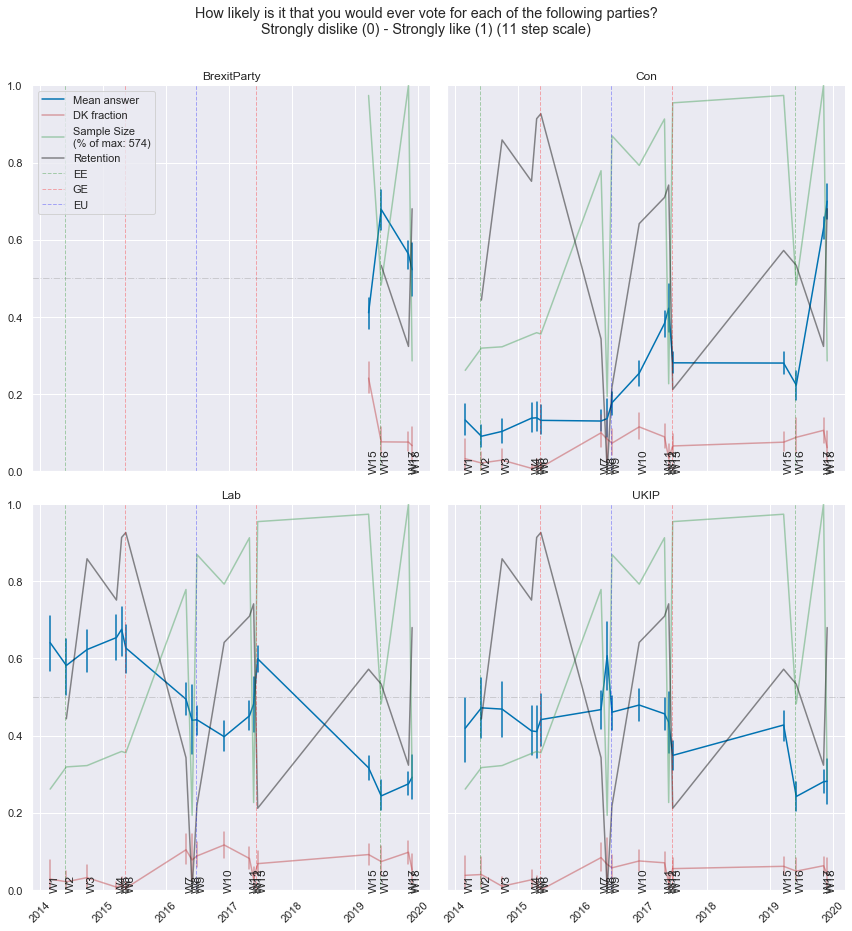

In [175]:
%%time
var_name = "ptv"
title= "\n".join(["How likely is it that you would ever vote for each of the following parties?",
                  "Strongly dislike (0) - Strongly like (1) (11 step scale)"])
specific_suffix_set = "(Con|Lab|UKIP|BrexitParty)"
# specific_suffix_set = "(Con)"
# 
col_wrap = 2
height   = 6

flat_df_num = plot_time_series(var_name=var_name,specific_suffix_set=specific_suffix_set,title=title,col_name="party",
                               col_wrap=col_wrap,treatment="ptv_timeseries",max_wave=max_wave,use_BES_weights=use_BES_weights,
                               mask = mask,n_boot=1000,aspect=1,
                              )
                               #,use_BES_weights=True)

In [158]:
%%time

y_axis_label = "circles=daily-mean/line=moving average"
x_axis_label = "Response Date"


suff_list = specific_suffix_set.replace(")","").replace("(","").split("|")
color_dict = dict(zip(suff_list,colour_list))
title_dict = dict(zip(suff_list,["How likely is it that you would ever vote for each of the following parties? "+"("+x+")?" for x in suff_list]))

prominence=.15
width=20
                                 
df,df_rolling = bokeh_explorer_charts(x_axis_label,y_axis_label,color_dict,title_dict, var_name,
                    prominence=prominence,width=width, rolling_win_type=rolling_win_type)

Con


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2017-04-29 06:00:00,0.164285,43,2079,367.941196,0.349820,2016-12-07 18:00:00,2017-06-11 11:00:00
2019-03-24 18:00:00,0.172839,43,2422,83.635815,0.357156,2019-03-23 08:00:00,2019-05-24 18:00:00


Lab


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2015-03-26 09:00:00,0.153435,157,2380,453.355989,0.558378,2014-09-25 00:00:00,2015-05-05 13:00:00
2017-06-15 16:00:00,0.225008,1486,2380,168.897410,0.452872,2017-06-07 09:00:00,2017-06-22 08:00:00


UKIP


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2016-12-09 03:00:00,0.173288,7,2446,100.546041,0.49352,2016-12-03 11:00:00,2017-04-24 16:00:00


BrexitParty


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2019-06-05 23:00:00,0.25383,74,601,219.73232,0.551031,2019-05-26 17:00:00,2019-11-02 11:00:00


Wall time: 22.8 s


## Repeat the previous analysis but with a tight definition of "First Time Conservative"
## Only people for which we *definitely* have their 05/10/15/17 votes
## And only those over 32 in 2019 who *could* have voted 05-17
## Will also drop chart panels where nothing much interesting is happening

In [177]:
Con2019 = BES_Panel["p_past_vote_2019"]=="Conservative"

past_elections = ["p_past_vote_2005","p_past_vote_2010","p_past_vote_2015","p_past_vote_2017",]
# past_elections = ["p_past_vote_2015","p_past_vote_2017",]

ConBefore2019 = (BES_Panel[past_elections]=="Conservative").any(axis=1)
mask = Con2019&(~ConBefore2019)&BES_Panel[past_elections].notnull().all(axis=1)&(BES_Panel["ageW19"]>32)
mask.sum()

843

In [178]:
# %%time
# var_name = "like"
# title= "\n".join(["How much do you like or dislike each of the following parties?",
#                   "Strongly dislike (0) - Strongly like (1) (11 step scale)"])
# specific_suffix_set = "(Con|Lab|LD|UKIP|Grn|TIG|BNP|BrexitParty)"
# # specific_suffix_set = "(Con)"
# # 
# col_wrap = 3
# height   = 4

# flat_df_num = plot_time_series(var_name=var_name,specific_suffix_set=specific_suffix_set,title=title,col_name="party",
#                                col_wrap=col_wrap,treatment="immig_timeseries",max_wave=max_wave,use_BES_weights=use_BES_weights,
#                                mask = mask,n_boot=1000,aspect=1.15,
#                               )
#                                #,use_BES_weights=True)

Wall time: 44 s


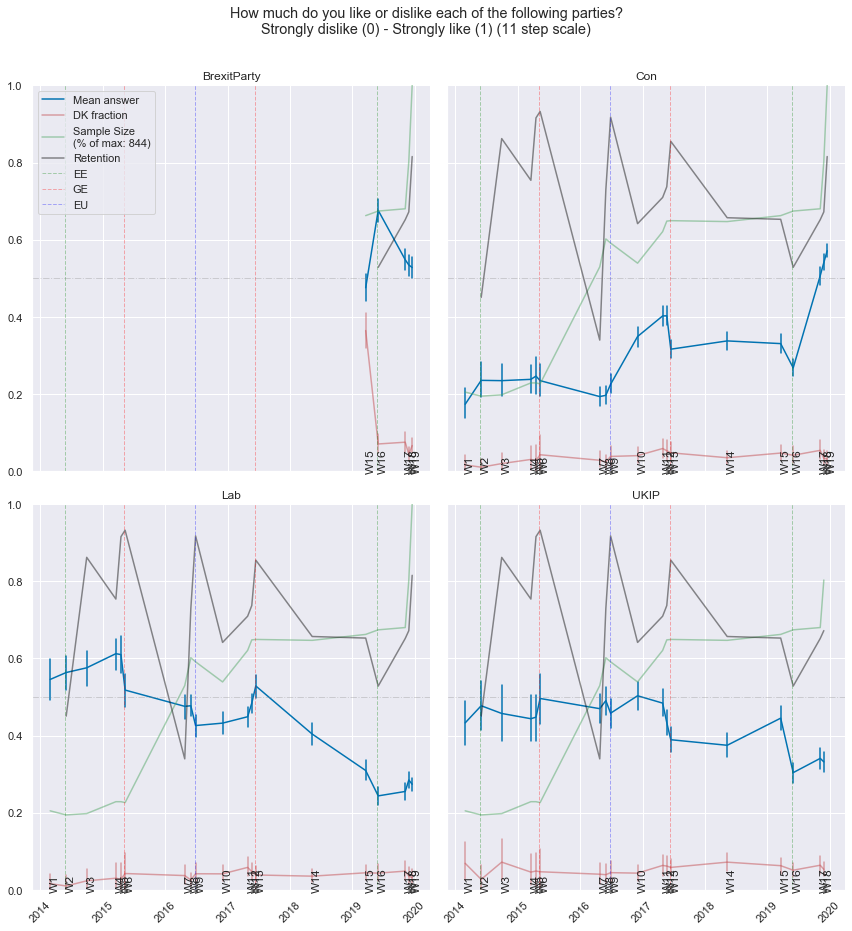

In [174]:
%%time
var_name = "like"
title= "\n".join(["How much do you like or dislike each of the following parties?",
                  "Strongly dislike (0) - Strongly like (1) (11 step scale)"])
specific_suffix_set = "(Con|Lab|UKIP|BrexitParty)"
# specific_suffix_set = "(Con)"
# 
col_wrap = 2
height   = 6

flat_df_num = plot_time_series(var_name=var_name,specific_suffix_set=specific_suffix_set,title=title,col_name="party",
                               col_wrap=col_wrap,treatment="immig_timeseries",max_wave=max_wave,use_BES_weights=use_BES_weights,
                               mask = mask,n_boot=1000,aspect=1,
                              )
                               #,use_BES_weights=True)

In [162]:
%%time

y_axis_label = "circles=daily-mean/line=moving average"
x_axis_label = "Response Date"


suff_list = specific_suffix_set.replace(")","").replace("(","").split("|")
color_dict = dict(zip(suff_list,colour_list))
title_dict = dict(zip(suff_list,["How much do you like (1) or dislike (0) each of the following parties? "+"("+x+")?" for x in suff_list]))

prominence=.15
width=20
                                 
df,df_rolling = bokeh_explorer_charts(x_axis_label,y_axis_label,color_dict,title_dict, var_name,
                    prominence=prominence,width=width, rolling_win_type=rolling_win_type)

Con


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2017-04-29 17:00:00,0.175515,602,2498,601.566841,0.340948,2016-11-29 17:00:00,2017-06-11 17:00:00


Lab


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


UKIP


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2016-12-06 20:00:00,0.181613,1139,2535,125.318765,0.487641,2016-12-02 11:00:00,2017-04-26 14:00:00


BrexitParty


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2019-06-06 08:00:00,0.213349,15,929,200.536001,0.607138,2019-05-26 13:00:00,2019-11-02 08:00:00


Wall time: 22.6 s


In [179]:
# %%time
# var_name = "ptv"
# title= "\n".join(["How likely is it that you would ever vote for each of the following parties?",
#                   "Strongly dislike (0) - Strongly like (1) (11 step scale)"])
# specific_suffix_set = "(Con|Lab|LD|UKIP|Grn|TIG|BNP|BrexitParty)"
# # specific_suffix_set = "(Con)"
# # 
# col_wrap = 3
# height   = 4

# flat_df_num = plot_time_series(var_name=var_name,specific_suffix_set=specific_suffix_set,title=title,col_name="party",
#                                col_wrap=col_wrap,treatment="ptv_timeseries",max_wave=max_wave,use_BES_weights=use_BES_weights,
#                                mask = mask,n_boot=1000,aspect=1.15,
#                               )
#                                #,use_BES_weights=True)

Wall time: 30.6 s


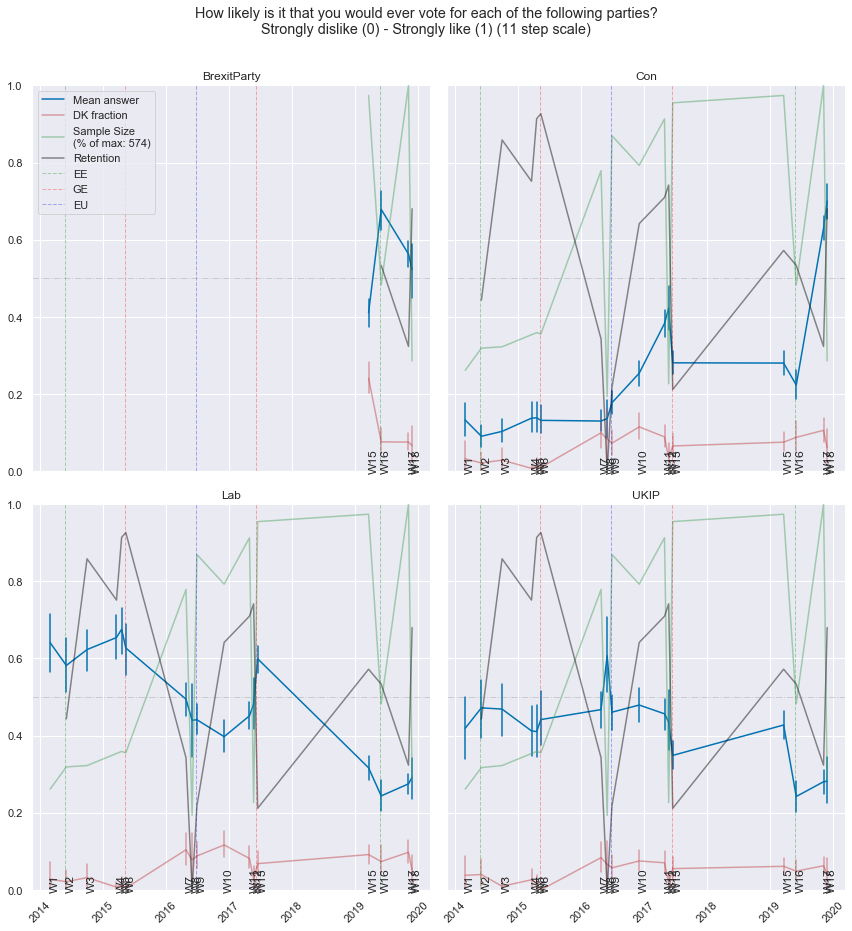

In [173]:
%%time
var_name = "ptv"
title= "\n".join(["How likely is it that you would ever vote for each of the following parties?",
                  "Strongly dislike (0) - Strongly like (1) (11 step scale)"])
specific_suffix_set = "(Con|Lab|UKIP|BrexitParty)"
# specific_suffix_set = "(Con)"
# 
col_wrap = 2
height   = 6

flat_df_num = plot_time_series(var_name=var_name,specific_suffix_set=specific_suffix_set,title=title,col_name="party",
                               col_wrap=col_wrap,treatment="ptv_timeseries",max_wave=max_wave,use_BES_weights=use_BES_weights,
                               mask = mask,n_boot=1000,aspect=1.0,
                              )

In [165]:
%%time

y_axis_label = "circles=daily-mean/line=moving average"
x_axis_label = "Response Date"


suff_list = specific_suffix_set.replace(")","").replace("(","").split("|")
color_dict = dict(zip(suff_list,colour_list))
title_dict = dict(zip(suff_list,["How likely is it that you would ever vote for each of the following parties? "+"("+x+")?" for x in suff_list]))

prominence=.15
width=20
                                 
df,df_rolling = bokeh_explorer_charts(x_axis_label,y_axis_label,color_dict,title_dict, var_name,
                    prominence=prominence,width=width, rolling_win_type=rolling_win_type)

Con


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2017-05-08 14:00:00,0.191952,160,1864,298.622834,0.310604,2016-12-07 10:00:00,2017-06-11 21:00:00


Lab


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2017-06-13 19:00:00,0.256408,1168,1883,200.950379,0.488014,2017-05-21 13:00:00,2017-06-23 10:00:00


UKIP


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2016-12-07 08:00:00,0.190825,521,1866,111.181031,0.484992,2016-12-02 15:00:00,2017-04-25 18:00:00
2019-03-20 10:00:00,0.177635,1480,1866,125.419047,0.388092,2019-03-14 09:00:00,2019-03-24 04:00:00


BrexitParty


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2019-06-02 09:00:00,0.161121,16,463,119.629049,0.614889,2019-05-28 19:00:00,2019-11-02 08:00:00


Wall time: 16.5 s


In [180]:
# %%time
# var_name = "like"
# title= "\n".join(["How much do you like or dislike each of the following politicians?",
#                   "Strongly dislike (0) - Strongly like (1) (11 step scale)"])
# specific_suffix_set = "(AlanJohnson|Bartley|Batten|Bennett|Berger|Berry|Blair|Johnson|Cable|Cameron|Clegg|Corbyn|Davey|Davidson|Davis|Farage|Farron|Gove|Harvie|Hunt|Jarvis|Javid|Leonard|LongBailey|Lucas|May|McDonnell|Miliband|Mogg|Moran|Nuttall|Osborne|Phillips|Price|Rayner|Rennie|Rudd|SEvans|Salmond|Soubry|Starmer|Sturgeon|Swinson|Umunna|Watson|Wood)"
# # 
# col_wrap = 3
# height   = 4

# flat_df_num = plot_time_series(var_name=var_name,specific_suffix_set=specific_suffix_set,title=title,col_name="party",
#                                col_wrap=col_wrap,treatment="immig_timeseries",max_wave=max_wave,use_BES_weights=use_BES_weights,
#                                mask = mask,n_boot=1000,min_waves_included=1,aspect=1.15,)

Wall time: 1min 19s


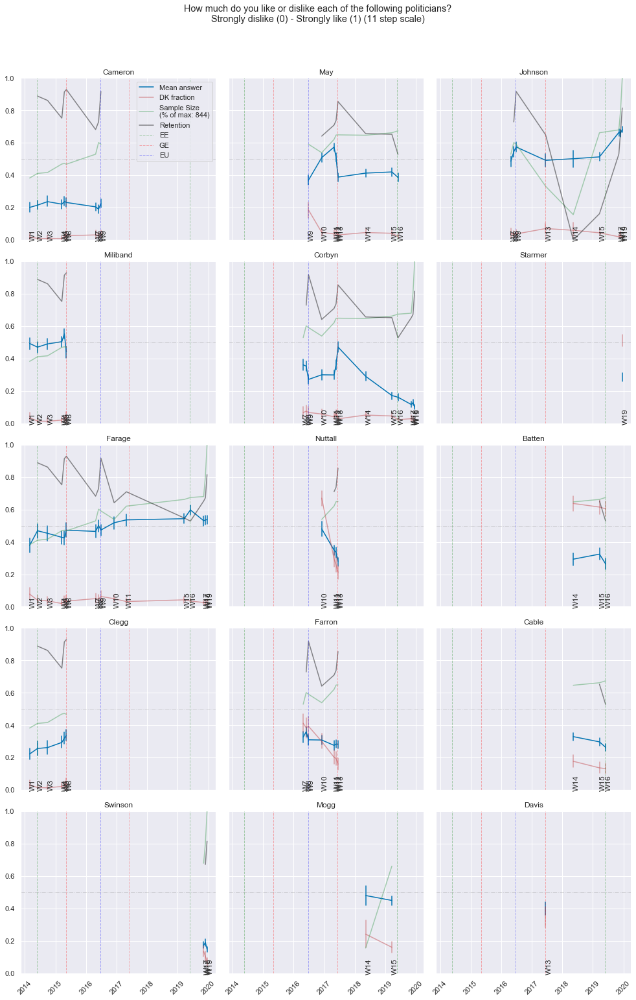

In [167]:
%%time
var_name = "like"
title= "\n".join(["How much do you like or dislike each of the following politicians?",
                  "Strongly dislike (0) - Strongly like (1) (11 step scale)"])
specific_suffix_set = "(Cameron|May|Johnson|Miliband|Corbyn|Starmer|Farage|Nuttall|Batten|Clegg|Farron|Cable|Swinson|Mogg|Davis)"

# 
col_wrap = 3
height   = 4

flat_df_num = plot_time_series(var_name=var_name,specific_suffix_set=specific_suffix_set,title=title,col_name="party",
                               col_wrap=col_wrap,treatment="immig_timeseries",max_wave=max_wave,use_BES_weights=use_BES_weights,
                               mask = mask,n_boot=1000,min_waves_included=1,aspect=1.15,
                               col_order=specific_suffix_set.replace(")","").replace("(","").split("|") )

In [172]:
%%time

y_axis_label = "circles=daily-mean/line=moving average"
x_axis_label = "Response Date"


suff_list = specific_suffix_set.replace(")","").replace("(","").split("|")
color_dict = dict(zip(suff_list,cycle(colour_list)))
title_dict = dict(zip(suff_list,["How much do you like (1) or dislike (0) each of the following politicians? "+"("+x+")?" for x in suff_list]))

prominence=.15
width=20
                                 
df,df_rolling = bokeh_explorer_charts(x_axis_label,y_axis_label,color_dict,title_dict, var_name,
                    prominence=prominence,width=width, rolling_win_type=rolling_win_type)


Cameron


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


May


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2017-04-27 09:00:00,0.230738,0,941,498.04603,0.480187,2016-11-26 21:00:00,2017-05-25 12:00:00


Johnson


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Miliband


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Corbyn


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2017-06-13 18:00:00,0.25448,541,2655,275.503552,0.371878,2017-05-25 12:00:00,2017-06-22 19:00:00


Starmer


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Farage


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Nuttall


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Batten


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Clegg


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Farron


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Cable


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Swinson


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Mogg


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Davis


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Wall time: 36.7 s


## Patterns around Labour support are ... a bit weird
## Could it be the minority that backed Remain?
## Try dropping them and see what happens

In [183]:
Con2019 = BES_Panel["p_past_vote_2019"]=="Conservative"

past_elections = ["p_past_vote_2005","p_past_vote_2010","p_past_vote_2015","p_past_vote_2017",]
# past_elections = ["p_past_vote_2015","p_past_vote_2017",]

ConBefore2019 = (BES_Panel[past_elections]=="Conservative").any(axis=1)
mask = Con2019&(~ConBefore2019)&BES_Panel[past_elections].notnull().all(axis=1)&(BES_Panel["ageW19"]>32)&(BES_Panel["p_eurefvote"]=="Leave the EU")
mask.sum()

716

Wall time: 40.2 s


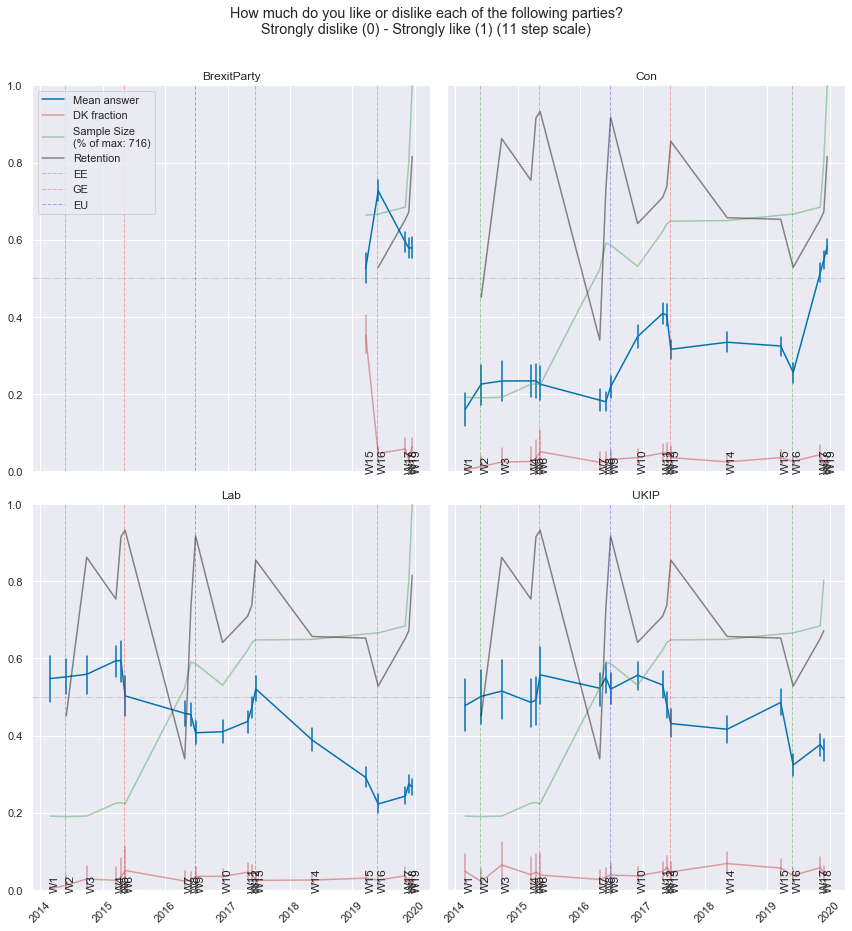

In [184]:
%%time
var_name = "like"
title= "\n".join(["How much do you like or dislike each of the following parties?",
                  "Strongly dislike (0) - Strongly like (1) (11 step scale)"])
specific_suffix_set = "(Con|Lab|UKIP|BrexitParty)"
# specific_suffix_set = "(Con)"
# 
col_wrap = 2
height   = 6

flat_df_num = plot_time_series(var_name=var_name,specific_suffix_set=specific_suffix_set,title=title,col_name="party",
                               col_wrap=col_wrap,treatment="immig_timeseries",max_wave=max_wave,use_BES_weights=use_BES_weights,
                               mask = mask,n_boot=1000,aspect=1,
                              )
                               #,use_BES_weights=True)

In [185]:
%%time

y_axis_label = "circles=daily-mean/line=moving average"
x_axis_label = "Response Date"


suff_list = specific_suffix_set.replace(")","").replace("(","").split("|")
color_dict = dict(zip(suff_list,colour_list))
title_dict = dict(zip(suff_list,["How much do you like (1) or dislike (0) each of the following parties? "+"("+x+")?" for x in suff_list]))

prominence=.15
width=20
                                 
df,df_rolling = bokeh_explorer_charts(x_axis_label,y_axis_label,color_dict,title_dict, var_name,
                    prominence=prominence,width=width, rolling_win_type=rolling_win_type)

Con


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2017-04-29 21:00:00,0.202788,3,2293,564.298862,0.339552,2016-11-28 19:00:00,2017-06-11 19:00:00


Lab


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2017-06-13 23:00:00,0.151509,988,2371,331.304933,0.461575,2017-05-14 18:00:00,2017-06-20 10:00:00


UKIP


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


BrexitParty


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2019-06-05 12:00:00,0.233219,0,857,181.913731,0.653064,2019-05-26 13:00:00,2019-11-01 19:00:00


Wall time: 21.3 s


Wall time: 28 s


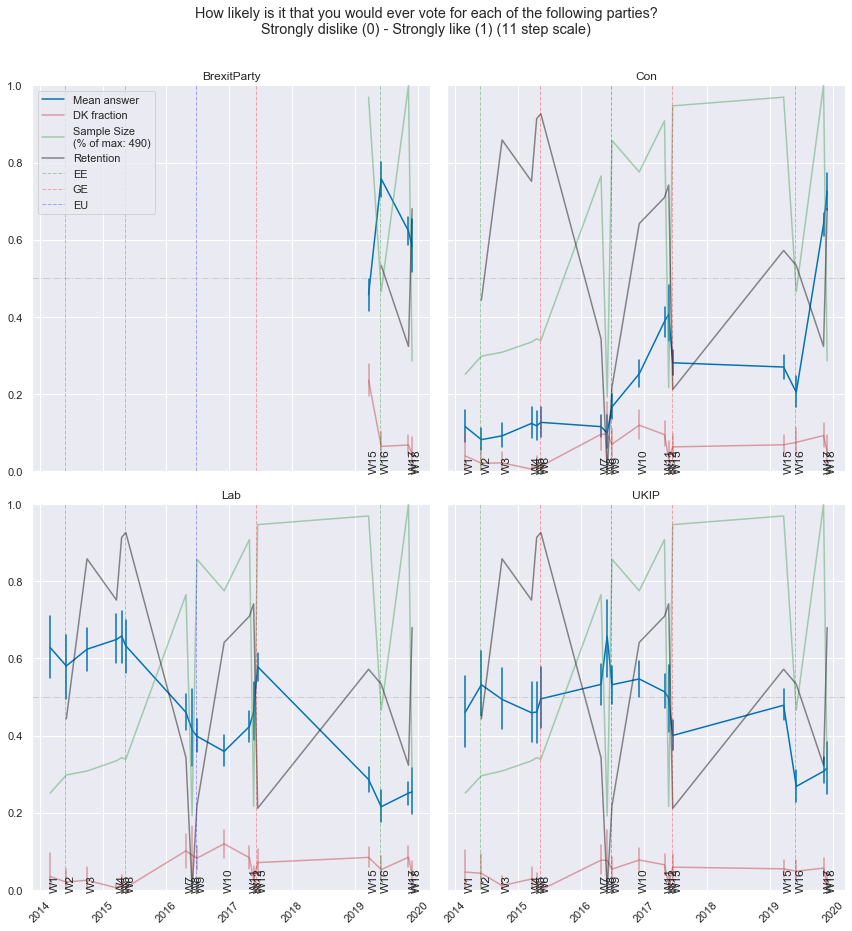

In [186]:
%%time
var_name = "ptv"
title= "\n".join(["How likely is it that you would ever vote for each of the following parties?",
                  "Strongly dislike (0) - Strongly like (1) (11 step scale)"])
specific_suffix_set = "(Con|Lab|UKIP|BrexitParty)"
# specific_suffix_set = "(Con)"
# 
col_wrap = 2
height   = 6

flat_df_num = plot_time_series(var_name=var_name,specific_suffix_set=specific_suffix_set,title=title,col_name="party",
                               col_wrap=col_wrap,treatment="ptv_timeseries",max_wave=max_wave,use_BES_weights=use_BES_weights,
                               mask = mask,n_boot=1000,aspect=1.0,
                              )

In [187]:
%%time

y_axis_label = "circles=daily-mean/line=moving average"
x_axis_label = "Response Date"


suff_list = specific_suffix_set.replace(")","").replace("(","").split("|")
color_dict = dict(zip(suff_list,colour_list))
title_dict = dict(zip(suff_list,["How likely is it that you would ever vote for each of the following parties? "+"("+x+")?" for x in suff_list]))

prominence=.15
width=20
                                 
df,df_rolling = bokeh_explorer_charts(x_axis_label,y_axis_label,color_dict,title_dict, var_name,
                    prominence=prominence,width=width, rolling_win_type=rolling_win_type)

Con


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2017-05-03 07:00:00,0.191684,94,1677,281.828696,0.307373,2016-12-06 17:00:00,2017-06-12


Lab


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2017-06-14 04:00:00,0.250309,1023,1686,198.522451,0.464259,2017-05-14 01:00:00,2017-06-22 11:00:00


UKIP


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2016-12-06 18:00:00,0.162296,434,1718,143.515836,0.525149,2016-11-30 14:00:00,2017-04-26 20:00:00


BrexitParty


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2019-06-01 23:00:00,0.158294,0,410,123.981556,0.669029,2019-05-27 10:00:00,2019-11-02 15:00:00


Wall time: 16.6 s


Wall time: 1min 10s


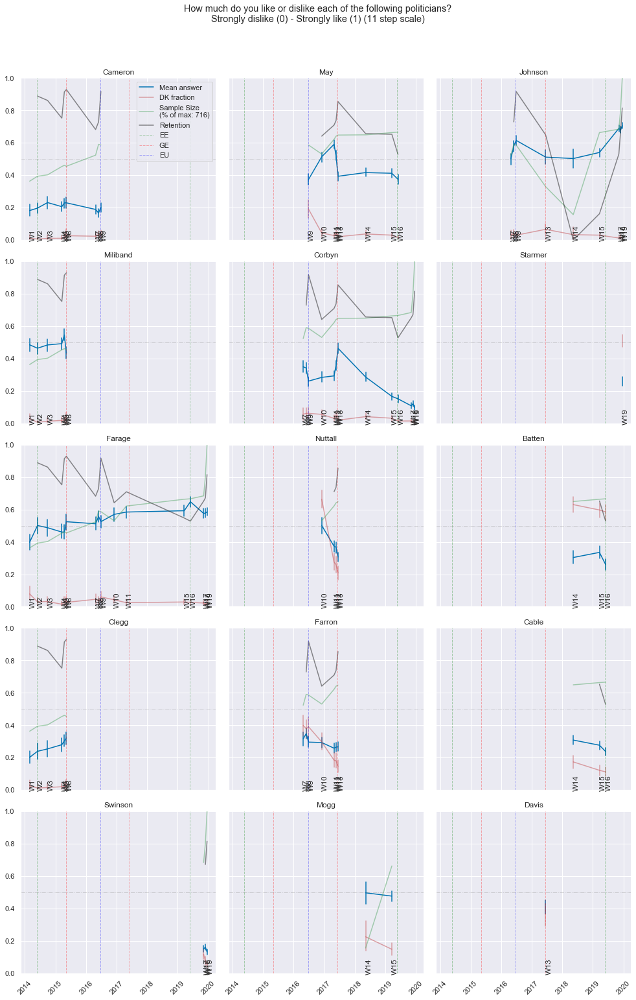

In [188]:
%%time
var_name = "like"
title= "\n".join(["How much do you like or dislike each of the following politicians?",
                  "Strongly dislike (0) - Strongly like (1) (11 step scale)"])
specific_suffix_set = "(Cameron|May|Johnson|Miliband|Corbyn|Starmer|Farage|Nuttall|Batten|Clegg|Farron|Cable|Swinson|Mogg|Davis)"

# 
col_wrap = 3
height   = 4

flat_df_num = plot_time_series(var_name=var_name,specific_suffix_set=specific_suffix_set,title=title,col_name="party",
                               col_wrap=col_wrap,treatment="immig_timeseries",max_wave=max_wave,use_BES_weights=use_BES_weights,
                               mask = mask,n_boot=1000,min_waves_included=1,aspect=1.15,
                               col_order=specific_suffix_set.replace(")","").replace("(","").split("|") )

In [189]:
%%time

y_axis_label = "circles=daily-mean/line=moving average"
x_axis_label = "Response Date"


suff_list = specific_suffix_set.replace(")","").replace("(","").split("|")
color_dict = dict(zip(suff_list,colour_list))
title_dict = dict(zip(suff_list,["How much do you like (1) or dislike (0) each of the following parties? "+"("+x+")?" for x in suff_list]))

prominence=.15
width=20
                                 
df,df_rolling = bokeh_explorer_charts(x_axis_label,y_axis_label,color_dict,title_dict, var_name,
                    prominence=prominence,width=width, rolling_win_type=rolling_win_type)

Cameron


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


May


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2017-04-27 18:00:00,0.245705,0,1332,468.754359,0.48428,2016-11-26 22:00:00,2017-05-26 11:00:00


Johnson


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2016-06-25 20:00:00,0.152963,0,606,274.683189,0.568985,2016-05-24 15:00:00,2016-06-29 07:00:00


Miliband


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Corbyn


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,
2017-06-14 04:00:00,0.242295,466,2470,259.070286,0.369649,2017-05-24 03:00:00,2017-06-21 15:00:00


Starmer


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Farage


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Nuttall


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Batten


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Clegg


,prominences,left_bases,right_bases,widths,width_heights,start,stop
date,,,,,,,


Wall time: 27.5 s
